In [ ]:
# Standard library imports
import os
import time
import logging

import numpy as np
from sklearn.model_selection import train_test_split

# Image processing
import skimage
from tensorflow.keras.preprocessing import image

# Visualization
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# TensorFlow and Keras imports
import tensorflow as tf
from tensorflow.keras.layers import (
    Input,
    Conv2D,
    Add,
    Concatenate,
    ReLU,
    Lambda,
    Layer
)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (
    ModelCheckpoint,
    LearningRateScheduler,
    EarlyStopping
)

# File operations
from glob import glob
import kaggle
import random
import shutil
from tensorflow.keras.utils import Progbar

c:\Users\abdul\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [ ]:
download_path = "Data"

kaggle.api.dataset_download_files(
    'praveengovi/coronahack-chest-xraydataset',
    path=download_path,
    unzip=True
)

Dataset URL: https://www.kaggle.com/datasets/praveengovi/coronahack-chest-xraydataset


In [ ]:
os.rename(r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\test",
         r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\trainO")

os.rename(r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\train",
         r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\extras")

In [ ]:
os.mkdir(r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\valO")
os.mkdir(r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\valN")
os.mkdir(r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\testO")
os.mkdir(r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\testN")
os.mkdir(r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\trainN")

In [ ]:
source = r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\extras"
destVal = r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\valO"
destTest = r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\testO"
destTrain = r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\trainO"

In [ ]:
def moveData(src, dest, nos):
    all_files = os.listdir(src)
    random.shuffle(all_files)

    for no, i in enumerate(all_files):
        if no == nos:
            break
        source_path = os.path.join(src, i)
        dest_path = os.path.join(dest, i)
        shutil.move(source_path, dest_path)

In [ ]:
moveData(source,destTrain,400)
moveData(source,destVal,300)
moveData(source,destTest,200)

In [ ]:
print(len(os.listdir(destTrain)))
print(len(os.listdir(destVal)))
print(len(os.listdir(destTest)))

1024
300
200


### Process the Data

- Adding Noise Gaussian White (Noise level is 40)

In [ ]:
destTrainN = r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\trainN"
destValN = r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\valN"
destTestN = r"C:\Users\abdul\Downloads\BMME575Model\SOTA\Data\Coronahack-Chest-XRay-Dataset\Coronahack-Chest-XRay-Dataset\testN"

In [ ]:
def processData(path,noisyDataPath):
  imgsPaths = os.listdir(path)
  imgsPaths = [os.path.join(path, i) for i in imgsPaths]
  spath = noisyDataPath
  print("Processing...")
  pb_i = Progbar(len(imgsPaths))
  for no,p in enumerate(imgsPaths):
    img = image.load_img(p)
    img = image.img_to_array(img)
    img /= 255.0
    noiseImg = skimage.util.random_noise(img,mode='gaussian', clip=True,var=0.155**2)
    noisy_image_path = os.path.join(spath, f"img{no}.jpeg")
    image.save_img(noisy_image_path, noiseImg)
    pb_i.add(1)
  print("Saving...")
  pb_i = Progbar(len(imgsPaths))
  for no,src in enumerate(imgsPaths):
    newName = os.path.join(path, f"img{no}.jpeg")
    os.rename(src,newName)
    pb_i.add(1)

In [ ]:
processData(destTrain,destTrainN)

Processing...
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 240s 235ms/step
Saving...
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step


In [ ]:
processData(destVal,destValN)

Processing...
300/300 ━━━━━━━━━━━━━━━━━━━━ 60s 200ms/step
Saving...
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step


In [ ]:
processData(destTest,destTestN)

Processing...
200/200 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step
Saving...
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step


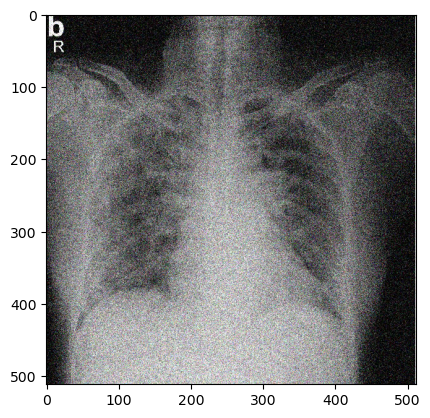

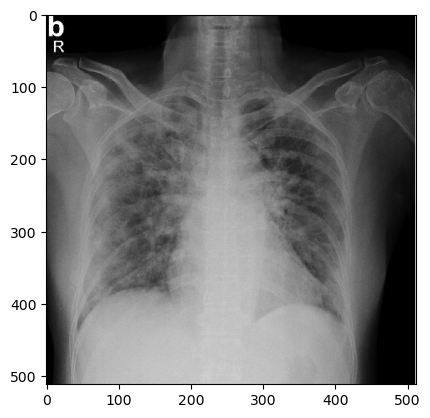

In [ ]:
imgN = image.load_img("C:\\Users\\abdul\\Downloads\\BMME575Model\\SOTA\\Data\\Coronahack-Chest-XRay-Dataset\\Coronahack-Chest-XRay-Dataset\\trainN\\img0.jpeg", target_size=(512,512))
imgN = image.img_to_array(imgN)
imgN /= 255.0

img1 = image.load_img(destTrain+"/"+"img0.jpeg",target_size=(512,512))
img1 = image.img_to_array(img1)
img1 /= 255.0

plt.imshow(imgN)
plt.show()
plt.imshow(img1)
plt.show()

### Datagen

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
import os

def datagen(noisy_folder, original_folder, batch_size=32, img_size=(488,488)):
    noisy_images = sorted(os.listdir(noisy_folder))
    original_images = sorted(os.listdir(original_folder))

    # Verify that we have the same number of images in both folders
    assert len(noisy_images) == len(original_images), \
        f"Mismatch in number of images: {len(noisy_images)} noisy images and {len(original_images)} original images."

    while True:
        batch_noisy = []
        batch_original = []

        for i in range(batch_size):
            idx = np.random.randint(0, len(noisy_images))

            # Load the noisy and original images
            noisy_img = image.load_img(os.path.join(noisy_folder, noisy_images[idx]), target_size=img_size, color_mode="grayscale")
            noisy_img = image.img_to_array(noisy_img) / 255.0

            original_img = image.load_img(os.path.join(original_folder, original_images[idx]), target_size=img_size, color_mode="grayscale")
            original_img = image.img_to_array(original_img) / 255.0

            batch_noisy.append(noisy_img)
            batch_original.append(original_img)

        yield (np.array(batch_noisy), np.array(batch_original))


#### BM3D and Wiener Eval

From : https://pypi.org/project/bm3d/ Version:bm3d 4.0.3

BM3D is an algorithm for attenuation of additive spatially correlated stationary (aka colored) Gaussian noise. This package provides a wrapper for the BM3D binaries for use for grayscale, color and other multichannel images for denoising and deblurring.

This implementation is based on

-Y. Mäkinen, L. Azzari, A. Foi, 2020, "Collaborative Filtering of Correlated Noise: Exact Transform-Domain Variance for Improved Shrinkage and Patch Matching", in IEEE Transactions on Image Processing, vol. 29, pp. 8339-8354.\n

-K. Dabov, A. Foi, V. Katkovnik, K. Egiazarian, 2007, "Image Denoising by Sparse 3-D Transform-Domain Collaborative Filtering", in IEEE Transactions on Image Processing, vol. 16, pp. 2080-2095.

In [ ]:
test_noisy_path = destTestN
test_original_path = destTest

Starting evaluation...


Denoising Progress:   0%|          | 0/200 [00:00<?, ?step/s]


Applying BM3D on step 1/200...
visualizing sample with BM3D:
PSNR: 29.20 dB, MSE: 0.001201, SSIM: 0.7003


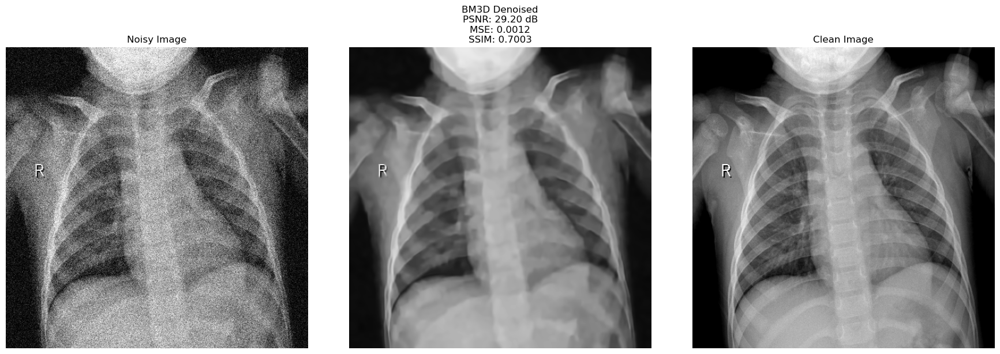


Applying WIENER on step 1/200...
visualizing sample with WIENER:
PSNR: 27.50 dB, MSE: 0.001779, SSIM: 0.5946


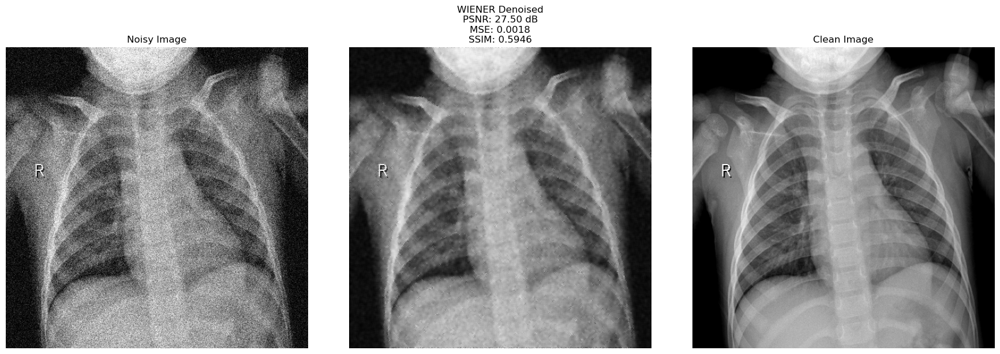

Denoising Progress:   0%|          | 1/200 [00:05<18:41,  5.64s/step]


Applying BM3D on step 2/200...
visualizing sample with BM3D:
PSNR: 30.42 dB, MSE: 0.000908, SSIM: 0.8079


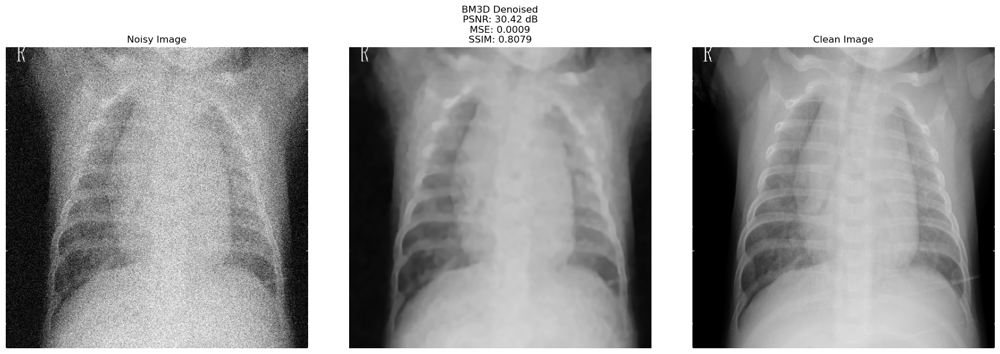


Applying WIENER on step 2/200...
visualizing sample with WIENER:
PSNR: 28.26 dB, MSE: 0.001494, SSIM: 0.5872


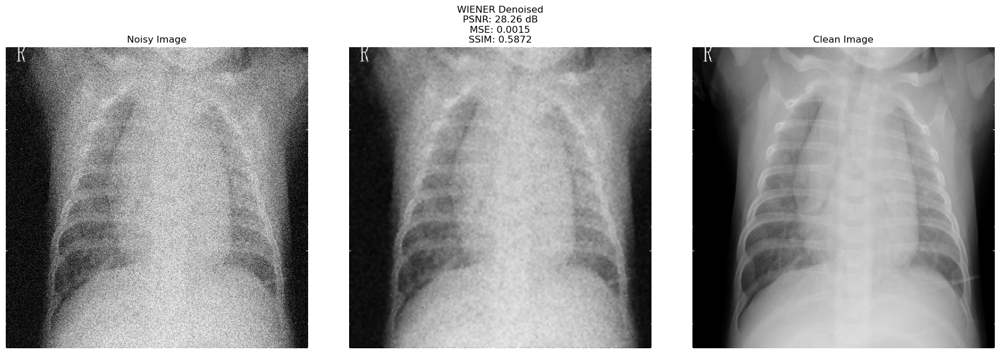

Denoising Progress:   1%|          | 2/200 [00:10<17:32,  5.32s/step]


Applying BM3D on step 3/200...
visualizing sample with BM3D:
PSNR: 33.32 dB, MSE: 0.000466, SSIM: 0.8968


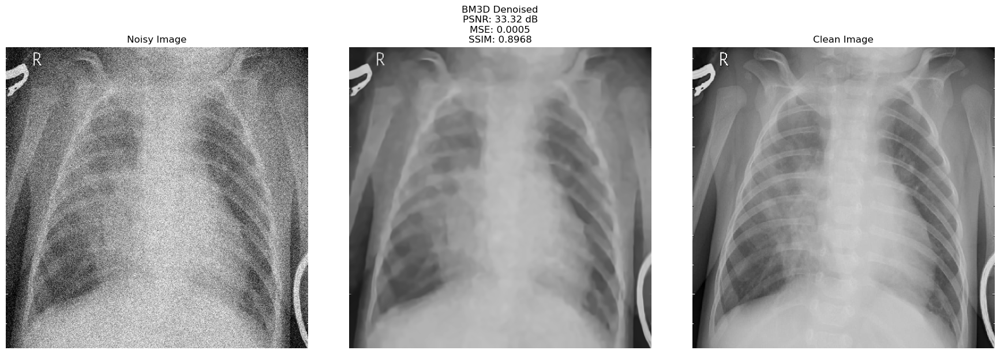


Applying WIENER on step 3/200...
visualizing sample with WIENER:
PSNR: 30.08 dB, MSE: 0.000982, SSIM: 0.7108


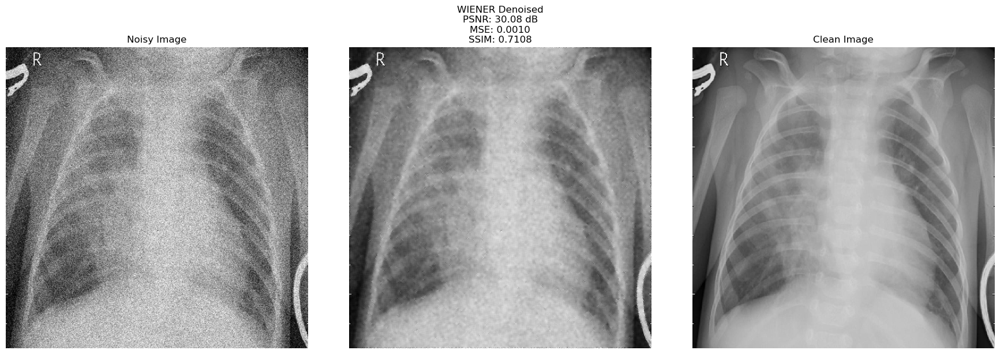

Denoising Progress:   2%|▏         | 3/200 [00:16<17:37,  5.37s/step]


Applying BM3D on step 4/200...
visualizing sample with BM3D:
PSNR: 29.65 dB, MSE: 0.001084, SSIM: 0.7368


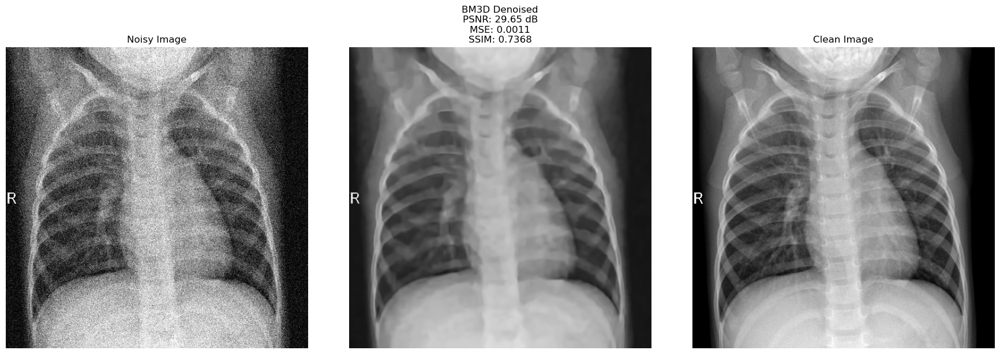


Applying WIENER on step 4/200...
visualizing sample with WIENER:
PSNR: 27.91 dB, MSE: 0.001620, SSIM: 0.6374


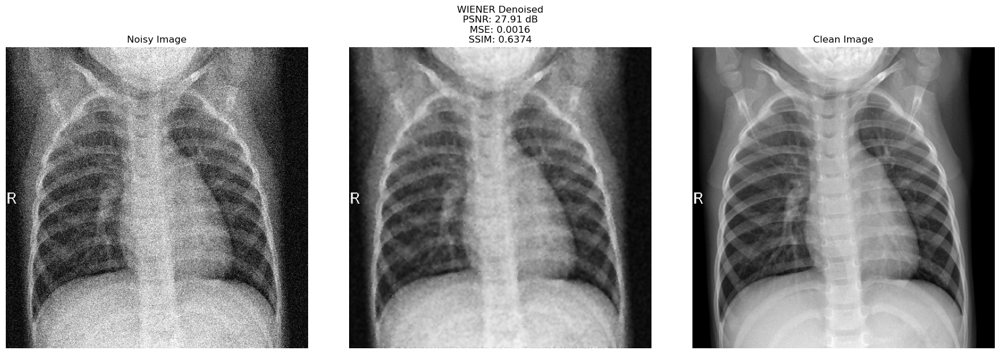

Denoising Progress:   2%|▏         | 4/200 [00:21<17:04,  5.23s/step]


Applying BM3D on step 5/200...
visualizing sample with BM3D:
PSNR: 32.22 dB, MSE: 0.000600, SSIM: 0.8588


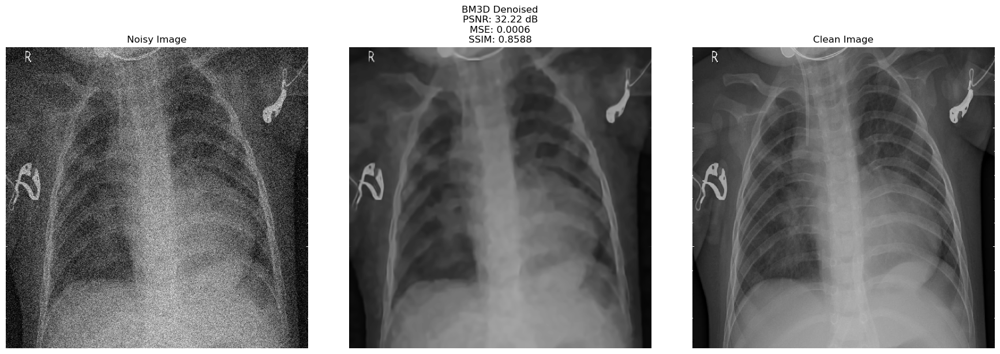


Applying WIENER on step 5/200...
visualizing sample with WIENER:
PSNR: 29.45 dB, MSE: 0.001136, SSIM: 0.6710


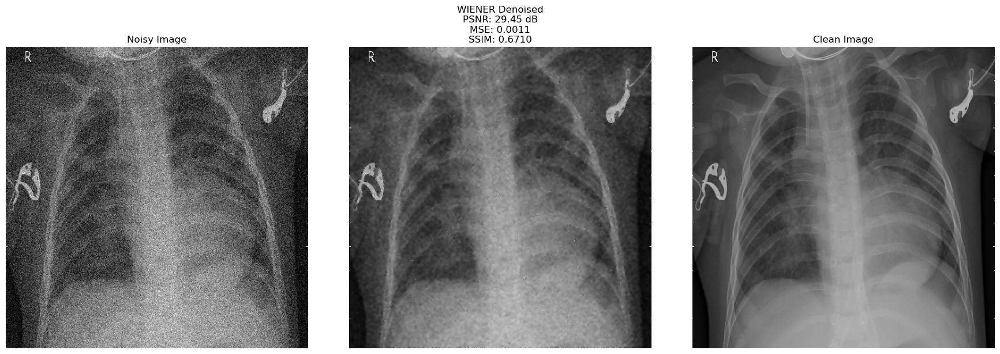

Denoising Progress:   2%|▎         | 5/200 [00:25<16:19,  5.03s/step]


Applying BM3D on step 6/200...


Denoising Progress:   3%|▎         | 6/200 [00:30<15:22,  4.76s/step]


Applying WIENER on step 6/200...

Applying BM3D on step 7/200...


Denoising Progress:   4%|▎         | 7/200 [00:33<14:12,  4.42s/step]


Applying WIENER on step 7/200...

Applying BM3D on step 8/200...


Denoising Progress:   4%|▍         | 8/200 [00:37<13:31,  4.23s/step]


Applying WIENER on step 8/200...

Applying BM3D on step 9/200...


Denoising Progress:   4%|▍         | 9/200 [00:41<13:03,  4.10s/step]


Applying WIENER on step 9/200...

Applying BM3D on step 10/200...


Denoising Progress:   5%|▌         | 10/200 [00:45<12:57,  4.09s/step]


Applying WIENER on step 10/200...

Applying BM3D on step 11/200...


Denoising Progress:   6%|▌         | 11/200 [00:49<12:51,  4.08s/step]


Applying WIENER on step 11/200...

Applying BM3D on step 12/200...


Denoising Progress:   6%|▌         | 12/200 [00:53<12:46,  4.08s/step]


Applying WIENER on step 12/200...

Applying BM3D on step 13/200...


Denoising Progress:   6%|▋         | 13/200 [00:57<12:41,  4.07s/step]


Applying WIENER on step 13/200...

Applying BM3D on step 14/200...


Denoising Progress:   7%|▋         | 14/200 [01:02<12:52,  4.16s/step]


Applying WIENER on step 14/200...

Applying BM3D on step 15/200...


Denoising Progress:   8%|▊         | 15/200 [01:06<12:59,  4.21s/step]


Applying WIENER on step 15/200...

Applying BM3D on step 16/200...


Denoising Progress:   8%|▊         | 16/200 [01:10<12:36,  4.11s/step]


Applying WIENER on step 16/200...

Applying BM3D on step 17/200...


Denoising Progress:   8%|▊         | 17/200 [01:13<12:10,  3.99s/step]


Applying WIENER on step 17/200...

Applying BM3D on step 18/200...


Denoising Progress:   9%|▉         | 18/200 [01:18<12:17,  4.05s/step]


Applying WIENER on step 18/200...

Applying BM3D on step 19/200...


Denoising Progress:  10%|▉         | 19/200 [01:22<12:21,  4.10s/step]


Applying WIENER on step 19/200...

Applying BM3D on step 20/200...


Denoising Progress:  10%|█         | 20/200 [01:26<12:08,  4.05s/step]


Applying WIENER on step 20/200...

Applying BM3D on step 21/200...


Denoising Progress:  10%|█         | 21/200 [01:29<11:18,  3.79s/step]


Applying WIENER on step 21/200...

Applying BM3D on step 22/200...


Denoising Progress:  11%|█         | 22/200 [01:31<10:00,  3.37s/step]


Applying WIENER on step 22/200...

Applying BM3D on step 23/200...


Denoising Progress:  12%|█▏        | 23/200 [01:34<09:11,  3.12s/step]


Applying WIENER on step 23/200...

Applying BM3D on step 24/200...


Denoising Progress:  12%|█▏        | 24/200 [01:36<08:27,  2.88s/step]


Applying WIENER on step 24/200...

Applying BM3D on step 25/200...


Denoising Progress:  12%|█▎        | 25/200 [01:39<08:03,  2.77s/step]


Applying WIENER on step 25/200...

Applying BM3D on step 26/200...


Denoising Progress:  13%|█▎        | 26/200 [01:42<08:18,  2.86s/step]


Applying WIENER on step 26/200...

Applying BM3D on step 27/200...


Denoising Progress:  14%|█▎        | 27/200 [01:44<08:00,  2.78s/step]


Applying WIENER on step 27/200...

Applying BM3D on step 28/200...


Denoising Progress:  14%|█▍        | 28/200 [01:47<07:47,  2.72s/step]


Applying WIENER on step 28/200...

Applying BM3D on step 29/200...


Denoising Progress:  14%|█▍        | 29/200 [01:50<07:40,  2.69s/step]


Applying WIENER on step 29/200...

Applying BM3D on step 30/200...


Denoising Progress:  15%|█▌        | 30/200 [01:52<07:22,  2.60s/step]


Applying WIENER on step 30/200...

Applying BM3D on step 31/200...


Denoising Progress:  16%|█▌        | 31/200 [01:54<07:05,  2.52s/step]


Applying WIENER on step 31/200...

Applying BM3D on step 32/200...


Denoising Progress:  16%|█▌        | 32/200 [01:57<06:56,  2.48s/step]


Applying WIENER on step 32/200...

Applying BM3D on step 33/200...


Denoising Progress:  16%|█▋        | 33/200 [01:59<06:49,  2.45s/step]


Applying WIENER on step 33/200...

Applying BM3D on step 34/200...


Denoising Progress:  17%|█▋        | 34/200 [02:02<06:56,  2.51s/step]


Applying WIENER on step 34/200...

Applying BM3D on step 35/200...


Denoising Progress:  18%|█▊        | 35/200 [02:05<07:15,  2.64s/step]


Applying WIENER on step 35/200...

Applying BM3D on step 36/200...


Denoising Progress:  18%|█▊        | 36/200 [02:07<07:14,  2.65s/step]


Applying WIENER on step 36/200...

Applying BM3D on step 37/200...


Denoising Progress:  18%|█▊        | 37/200 [02:10<07:11,  2.65s/step]


Applying WIENER on step 37/200...

Applying BM3D on step 38/200...


Denoising Progress:  19%|█▉        | 38/200 [02:13<07:28,  2.77s/step]


Applying WIENER on step 38/200...

Applying BM3D on step 39/200...


Denoising Progress:  20%|█▉        | 39/200 [02:16<07:51,  2.93s/step]


Applying WIENER on step 39/200...

Applying BM3D on step 40/200...


Denoising Progress:  20%|██        | 40/200 [02:20<07:59,  3.00s/step]


Applying WIENER on step 40/200...

Applying BM3D on step 41/200...


Denoising Progress:  20%|██        | 41/200 [02:22<07:45,  2.93s/step]


Applying WIENER on step 41/200...

Applying BM3D on step 42/200...


Denoising Progress:  21%|██        | 42/200 [02:25<07:23,  2.81s/step]


Applying WIENER on step 42/200...

Applying BM3D on step 43/200...


Denoising Progress:  22%|██▏       | 43/200 [02:27<07:08,  2.73s/step]


Applying WIENER on step 43/200...

Applying BM3D on step 44/200...


Denoising Progress:  22%|██▏       | 44/200 [02:30<06:57,  2.67s/step]


Applying WIENER on step 44/200...

Applying BM3D on step 45/200...


Denoising Progress:  22%|██▎       | 45/200 [02:32<06:48,  2.64s/step]


Applying WIENER on step 45/200...

Applying BM3D on step 46/200...


Denoising Progress:  23%|██▎       | 46/200 [02:35<06:48,  2.65s/step]


Applying WIENER on step 46/200...

Applying BM3D on step 47/200...


Denoising Progress:  24%|██▎       | 47/200 [02:38<06:47,  2.66s/step]


Applying WIENER on step 47/200...

Applying BM3D on step 48/200...


Denoising Progress:  24%|██▍       | 48/200 [02:40<06:35,  2.60s/step]


Applying WIENER on step 48/200...

Applying BM3D on step 49/200...


Denoising Progress:  24%|██▍       | 49/200 [02:43<06:20,  2.52s/step]


Applying WIENER on step 49/200...

Applying BM3D on step 50/200...


Denoising Progress:  25%|██▌       | 50/200 [02:45<06:08,  2.46s/step]


Applying WIENER on step 50/200...

Applying BM3D on step 51/200...


Denoising Progress:  26%|██▌       | 51/200 [02:48<06:17,  2.54s/step]


Applying WIENER on step 51/200...

Applying BM3D on step 52/200...


Denoising Progress:  26%|██▌       | 52/200 [02:50<06:19,  2.56s/step]


Applying WIENER on step 52/200...

Applying BM3D on step 53/200...


Denoising Progress:  26%|██▋       | 53/200 [02:53<06:28,  2.64s/step]


Applying WIENER on step 53/200...

Applying BM3D on step 54/200...


Denoising Progress:  27%|██▋       | 54/200 [02:56<06:20,  2.61s/step]


Applying WIENER on step 54/200...

Applying BM3D on step 55/200...


Denoising Progress:  28%|██▊       | 55/200 [02:58<06:13,  2.57s/step]


Applying WIENER on step 55/200...

Applying BM3D on step 56/200...


Denoising Progress:  28%|██▊       | 56/200 [03:01<06:11,  2.58s/step]


Applying WIENER on step 56/200...

Applying BM3D on step 57/200...


Denoising Progress:  28%|██▊       | 57/200 [03:03<06:09,  2.58s/step]


Applying WIENER on step 57/200...

Applying BM3D on step 58/200...


Denoising Progress:  29%|██▉       | 58/200 [03:06<06:05,  2.58s/step]


Applying WIENER on step 58/200...

Applying BM3D on step 59/200...


Denoising Progress:  30%|██▉       | 59/200 [03:09<06:05,  2.60s/step]


Applying WIENER on step 59/200...

Applying BM3D on step 60/200...


Denoising Progress:  30%|███       | 60/200 [03:11<05:59,  2.57s/step]


Applying WIENER on step 60/200...

Applying BM3D on step 61/200...


Denoising Progress:  30%|███       | 61/200 [03:14<06:04,  2.62s/step]


Applying WIENER on step 61/200...

Applying BM3D on step 62/200...


Denoising Progress:  31%|███       | 62/200 [03:16<06:06,  2.65s/step]


Applying WIENER on step 62/200...

Applying BM3D on step 63/200...


Denoising Progress:  32%|███▏      | 63/200 [03:19<05:54,  2.59s/step]


Applying WIENER on step 63/200...

Applying BM3D on step 64/200...


Denoising Progress:  32%|███▏      | 64/200 [03:22<05:53,  2.60s/step]


Applying WIENER on step 64/200...

Applying BM3D on step 65/200...


Denoising Progress:  32%|███▎      | 65/200 [03:24<05:53,  2.62s/step]


Applying WIENER on step 65/200...

Applying BM3D on step 66/200...


Denoising Progress:  33%|███▎      | 66/200 [03:27<05:53,  2.64s/step]


Applying WIENER on step 66/200...

Applying BM3D on step 67/200...


Denoising Progress:  34%|███▎      | 67/200 [03:30<05:50,  2.63s/step]


Applying WIENER on step 67/200...

Applying BM3D on step 68/200...


Denoising Progress:  34%|███▍      | 68/200 [03:32<05:46,  2.63s/step]


Applying WIENER on step 68/200...

Applying BM3D on step 69/200...


Denoising Progress:  34%|███▍      | 69/200 [03:35<05:40,  2.60s/step]


Applying WIENER on step 69/200...

Applying BM3D on step 70/200...


Denoising Progress:  35%|███▌      | 70/200 [03:37<05:29,  2.54s/step]


Applying WIENER on step 70/200...

Applying BM3D on step 71/200...


Denoising Progress:  36%|███▌      | 71/200 [03:40<05:30,  2.56s/step]


Applying WIENER on step 71/200...

Applying BM3D on step 72/200...


Denoising Progress:  36%|███▌      | 72/200 [03:42<05:29,  2.58s/step]


Applying WIENER on step 72/200...

Applying BM3D on step 73/200...


Denoising Progress:  36%|███▋      | 73/200 [03:45<05:24,  2.56s/step]


Applying WIENER on step 73/200...

Applying BM3D on step 74/200...


Denoising Progress:  37%|███▋      | 74/200 [03:48<05:35,  2.66s/step]


Applying WIENER on step 74/200...

Applying BM3D on step 75/200...


Denoising Progress:  38%|███▊      | 75/200 [03:50<05:25,  2.61s/step]


Applying WIENER on step 75/200...

Applying BM3D on step 76/200...


Denoising Progress:  38%|███▊      | 76/200 [03:53<05:17,  2.56s/step]


Applying WIENER on step 76/200...

Applying BM3D on step 77/200...


Denoising Progress:  38%|███▊      | 77/200 [03:55<05:19,  2.59s/step]


Applying WIENER on step 77/200...

Applying BM3D on step 78/200...


Denoising Progress:  39%|███▉      | 78/200 [03:58<05:36,  2.76s/step]


Applying WIENER on step 78/200...

Applying BM3D on step 79/200...


Denoising Progress:  40%|███▉      | 79/200 [04:01<05:27,  2.71s/step]


Applying WIENER on step 79/200...

Applying BM3D on step 80/200...


Denoising Progress:  40%|████      | 80/200 [04:04<05:16,  2.64s/step]


Applying WIENER on step 80/200...

Applying BM3D on step 81/200...


Denoising Progress:  40%|████      | 81/200 [04:06<05:02,  2.54s/step]


Applying WIENER on step 81/200...

Applying BM3D on step 82/200...


Denoising Progress:  41%|████      | 82/200 [04:08<04:58,  2.53s/step]


Applying WIENER on step 82/200...

Applying BM3D on step 83/200...


Denoising Progress:  42%|████▏     | 83/200 [04:14<06:54,  3.54s/step]


Applying WIENER on step 83/200...

Applying BM3D on step 84/200...


Denoising Progress:  42%|████▏     | 84/200 [04:20<08:02,  4.16s/step]


Applying WIENER on step 84/200...

Applying BM3D on step 85/200...


Denoising Progress:  42%|████▎     | 85/200 [04:24<08:10,  4.26s/step]


Applying WIENER on step 85/200...

Applying BM3D on step 86/200...


Denoising Progress:  43%|████▎     | 86/200 [04:30<09:03,  4.76s/step]


Applying WIENER on step 86/200...

Applying BM3D on step 87/200...


Denoising Progress:  44%|████▎     | 87/200 [05:00<23:02, 12.23s/step]


Applying WIENER on step 87/200...

Applying BM3D on step 88/200...


Denoising Progress:  44%|████▍     | 88/200 [05:26<30:41, 16.44s/step]


Applying WIENER on step 88/200...

Applying BM3D on step 89/200...


Denoising Progress:  44%|████▍     | 89/200 [05:32<24:45, 13.38s/step]


Applying WIENER on step 89/200...

Applying BM3D on step 90/200...


Denoising Progress:  45%|████▌     | 90/200 [05:38<20:01, 10.92s/step]


Applying WIENER on step 90/200...

Applying BM3D on step 91/200...


Denoising Progress:  46%|████▌     | 91/200 [05:47<18:45, 10.33s/step]


Applying WIENER on step 91/200...

Applying BM3D on step 92/200...


Denoising Progress:  46%|████▌     | 92/200 [05:53<16:20,  9.08s/step]


Applying WIENER on step 92/200...

Applying BM3D on step 93/200...


Denoising Progress:  46%|████▋     | 93/200 [05:58<14:24,  8.08s/step]


Applying WIENER on step 93/200...

Applying BM3D on step 94/200...


Denoising Progress:  47%|████▋     | 94/200 [06:04<12:44,  7.21s/step]


Applying WIENER on step 94/200...

Applying BM3D on step 95/200...


Denoising Progress:  48%|████▊     | 95/200 [06:08<11:14,  6.42s/step]


Applying WIENER on step 95/200...

Applying BM3D on step 96/200...


Denoising Progress:  48%|████▊     | 96/200 [06:13<10:23,  6.00s/step]


Applying WIENER on step 96/200...

Applying BM3D on step 97/200...


Denoising Progress:  48%|████▊     | 97/200 [06:18<09:34,  5.58s/step]


Applying WIENER on step 97/200...

Applying BM3D on step 98/200...


Denoising Progress:  49%|████▉     | 98/200 [06:25<10:03,  5.92s/step]


Applying WIENER on step 98/200...

Applying BM3D on step 99/200...


Denoising Progress:  50%|████▉     | 99/200 [06:30<09:37,  5.72s/step]


Applying WIENER on step 99/200...

Applying BM3D on step 100/200...


Denoising Progress:  50%|█████     | 100/200 [06:34<08:42,  5.23s/step]


Applying WIENER on step 100/200...

Applying BM3D on step 101/200...


Denoising Progress:  50%|█████     | 101/200 [06:38<08:10,  4.95s/step]


Applying WIENER on step 101/200...

Applying BM3D on step 102/200...


Denoising Progress:  51%|█████     | 102/200 [06:43<07:52,  4.82s/step]


Applying WIENER on step 102/200...

Applying BM3D on step 103/200...


Denoising Progress:  52%|█████▏    | 103/200 [06:47<07:32,  4.67s/step]


Applying WIENER on step 103/200...

Applying BM3D on step 104/200...


Denoising Progress:  52%|█████▏    | 104/200 [06:51<07:07,  4.46s/step]


Applying WIENER on step 104/200...

Applying BM3D on step 105/200...


Denoising Progress:  52%|█████▎    | 105/200 [06:55<06:56,  4.38s/step]


Applying WIENER on step 105/200...

Applying BM3D on step 106/200...


Denoising Progress:  53%|█████▎    | 106/200 [06:59<06:41,  4.27s/step]


Applying WIENER on step 106/200...

Applying BM3D on step 107/200...


Denoising Progress:  54%|█████▎    | 107/200 [07:03<06:27,  4.16s/step]


Applying WIENER on step 107/200...

Applying BM3D on step 108/200...


Denoising Progress:  54%|█████▍    | 108/200 [07:08<06:31,  4.26s/step]


Applying WIENER on step 108/200...

Applying BM3D on step 109/200...


Denoising Progress:  55%|█████▍    | 109/200 [07:12<06:34,  4.34s/step]


Applying WIENER on step 109/200...

Applying BM3D on step 110/200...


Denoising Progress:  55%|█████▌    | 110/200 [07:16<06:26,  4.29s/step]


Applying WIENER on step 110/200...

Applying BM3D on step 111/200...


Denoising Progress:  56%|█████▌    | 111/200 [07:20<06:15,  4.22s/step]


Applying WIENER on step 111/200...

Applying BM3D on step 112/200...


Denoising Progress:  56%|█████▌    | 112/200 [07:27<07:19,  4.99s/step]


Applying WIENER on step 112/200...

Applying BM3D on step 113/200...


Denoising Progress:  56%|█████▋    | 113/200 [07:32<07:13,  4.98s/step]


Applying WIENER on step 113/200...

Applying BM3D on step 114/200...


Denoising Progress:  57%|█████▋    | 114/200 [07:36<06:47,  4.73s/step]


Applying WIENER on step 114/200...

Applying BM3D on step 115/200...


Denoising Progress:  57%|█████▊    | 115/200 [08:51<36:34, 25.82s/step]


Applying WIENER on step 115/200...

Applying BM3D on step 116/200...


Denoising Progress:  58%|█████▊    | 116/200 [09:00<29:09, 20.83s/step]


Applying WIENER on step 116/200...

Applying BM3D on step 117/200...


Denoising Progress:  58%|█████▊    | 117/200 [09:09<23:30, 17.00s/step]


Applying WIENER on step 117/200...

Applying BM3D on step 118/200...


Denoising Progress:  59%|█████▉    | 118/200 [09:14<18:22, 13.44s/step]


Applying WIENER on step 118/200...

Applying BM3D on step 119/200...


Denoising Progress:  60%|█████▉    | 119/200 [09:19<14:52, 11.02s/step]


Applying WIENER on step 119/200...

Applying BM3D on step 120/200...


Denoising Progress:  60%|██████    | 120/200 [09:24<12:11,  9.14s/step]


Applying WIENER on step 120/200...

Applying BM3D on step 121/200...


Denoising Progress:  60%|██████    | 121/200 [09:29<10:20,  7.85s/step]


Applying WIENER on step 121/200...

Applying BM3D on step 122/200...


Denoising Progress:  61%|██████    | 122/200 [09:33<09:00,  6.92s/step]


Applying WIENER on step 122/200...

Applying BM3D on step 123/200...


Denoising Progress:  62%|██████▏   | 123/200 [09:40<08:51,  6.90s/step]


Applying WIENER on step 123/200...

Applying BM3D on step 124/200...


Denoising Progress:  62%|██████▏   | 124/200 [09:46<08:08,  6.43s/step]


Applying WIENER on step 124/200...

Applying BM3D on step 125/200...


Denoising Progress:  62%|██████▎   | 125/200 [09:50<07:13,  5.78s/step]


Applying WIENER on step 125/200...

Applying BM3D on step 126/200...


Denoising Progress:  63%|██████▎   | 126/200 [09:55<06:42,  5.45s/step]


Applying WIENER on step 126/200...

Applying BM3D on step 127/200...


Denoising Progress:  64%|██████▎   | 127/200 [09:59<06:14,  5.14s/step]


Applying WIENER on step 127/200...

Applying BM3D on step 128/200...


Denoising Progress:  64%|██████▍   | 128/200 [10:03<05:51,  4.88s/step]


Applying WIENER on step 128/200...

Applying BM3D on step 129/200...


Denoising Progress:  64%|██████▍   | 129/200 [10:10<06:22,  5.39s/step]


Applying WIENER on step 129/200...

Applying BM3D on step 130/200...


Denoising Progress:  65%|██████▌   | 130/200 [10:15<06:13,  5.34s/step]


Applying WIENER on step 130/200...

Applying BM3D on step 131/200...


Denoising Progress:  66%|██████▌   | 131/200 [10:20<05:57,  5.19s/step]


Applying WIENER on step 131/200...

Applying BM3D on step 132/200...


Denoising Progress:  66%|██████▌   | 132/200 [10:24<05:35,  4.93s/step]


Applying WIENER on step 132/200...

Applying BM3D on step 133/200...


Denoising Progress:  66%|██████▋   | 133/200 [10:28<05:16,  4.73s/step]


Applying WIENER on step 133/200...

Applying BM3D on step 134/200...


Denoising Progress:  67%|██████▋   | 134/200 [10:33<05:03,  4.60s/step]


Applying WIENER on step 134/200...

Applying BM3D on step 135/200...


Denoising Progress:  68%|██████▊   | 135/200 [10:38<05:03,  4.67s/step]


Applying WIENER on step 135/200...

Applying BM3D on step 136/200...


Denoising Progress:  68%|██████▊   | 136/200 [10:44<05:36,  5.25s/step]


Applying WIENER on step 136/200...

Applying BM3D on step 137/200...


Denoising Progress:  68%|██████▊   | 137/200 [10:49<05:22,  5.12s/step]


Applying WIENER on step 137/200...

Applying BM3D on step 138/200...


Denoising Progress:  69%|██████▉   | 138/200 [10:53<05:01,  4.86s/step]


Applying WIENER on step 138/200...

Applying BM3D on step 139/200...


Denoising Progress:  70%|██████▉   | 139/200 [10:58<04:47,  4.72s/step]


Applying WIENER on step 139/200...

Applying BM3D on step 140/200...


Denoising Progress:  70%|███████   | 140/200 [11:02<04:37,  4.62s/step]


Applying WIENER on step 140/200...

Applying BM3D on step 141/200...


Denoising Progress:  70%|███████   | 141/200 [11:06<04:22,  4.44s/step]


Applying WIENER on step 141/200...

Applying BM3D on step 142/200...


Denoising Progress:  71%|███████   | 142/200 [11:10<04:06,  4.25s/step]


Applying WIENER on step 142/200...

Applying BM3D on step 143/200...


Denoising Progress:  72%|███████▏  | 143/200 [11:59<16:48, 17.69s/step]


Applying WIENER on step 143/200...

Applying BM3D on step 144/200...


Denoising Progress:  72%|███████▏  | 144/200 [12:07<13:51, 14.84s/step]


Applying WIENER on step 144/200...

Applying BM3D on step 145/200...


Denoising Progress:  72%|███████▎  | 145/200 [12:15<11:35, 12.64s/step]


Applying WIENER on step 145/200...

Applying BM3D on step 146/200...


Denoising Progress:  73%|███████▎  | 146/200 [12:20<09:18, 10.35s/step]


Applying WIENER on step 146/200...

Applying BM3D on step 147/200...


Denoising Progress:  74%|███████▎  | 147/200 [12:25<07:48,  8.83s/step]


Applying WIENER on step 147/200...

Applying BM3D on step 148/200...


Denoising Progress:  74%|███████▍  | 148/200 [12:32<07:16,  8.39s/step]


Applying WIENER on step 148/200...

Applying BM3D on step 149/200...


Denoising Progress:  74%|███████▍  | 149/200 [12:38<06:28,  7.62s/step]


Applying WIENER on step 149/200...

Applying BM3D on step 150/200...


Denoising Progress:  75%|███████▌  | 150/200 [12:43<05:39,  6.80s/step]


Applying WIENER on step 150/200...

Applying BM3D on step 151/200...


Denoising Progress:  76%|███████▌  | 151/200 [12:47<04:52,  5.96s/step]


Applying WIENER on step 151/200...

Applying BM3D on step 152/200...


Denoising Progress:  76%|███████▌  | 152/200 [12:51<04:13,  5.28s/step]


Applying WIENER on step 152/200...

Applying BM3D on step 153/200...


Denoising Progress:  76%|███████▋  | 153/200 [12:55<03:53,  4.98s/step]


Applying WIENER on step 153/200...

Applying BM3D on step 154/200...


Denoising Progress:  77%|███████▋  | 154/200 [13:01<04:02,  5.28s/step]


Applying WIENER on step 154/200...

Applying BM3D on step 155/200...


Denoising Progress:  78%|███████▊  | 155/200 [13:05<03:42,  4.95s/step]


Applying WIENER on step 155/200...

Applying BM3D on step 156/200...


Denoising Progress:  78%|███████▊  | 156/200 [13:09<03:26,  4.70s/step]


Applying WIENER on step 156/200...

Applying BM3D on step 157/200...


Denoising Progress:  78%|███████▊  | 157/200 [13:13<03:14,  4.53s/step]


Applying WIENER on step 157/200...

Applying BM3D on step 158/200...


Denoising Progress:  79%|███████▉  | 158/200 [13:18<03:06,  4.43s/step]


Applying WIENER on step 158/200...

Applying BM3D on step 159/200...


Denoising Progress:  80%|███████▉  | 159/200 [13:21<02:54,  4.26s/step]


Applying WIENER on step 159/200...

Applying BM3D on step 160/200...


Denoising Progress:  80%|████████  | 160/200 [13:25<02:43,  4.10s/step]


Applying WIENER on step 160/200...

Applying BM3D on step 161/200...


Denoising Progress:  80%|████████  | 161/200 [13:30<02:45,  4.23s/step]


Applying WIENER on step 161/200...

Applying BM3D on step 162/200...


Denoising Progress:  81%|████████  | 162/200 [13:34<02:41,  4.25s/step]


Applying WIENER on step 162/200...

Applying BM3D on step 163/200...


Denoising Progress:  82%|████████▏ | 163/200 [13:38<02:34,  4.18s/step]


Applying WIENER on step 163/200...

Applying BM3D on step 164/200...


Denoising Progress:  82%|████████▏ | 164/200 [13:42<02:30,  4.19s/step]


Applying WIENER on step 164/200...

Applying BM3D on step 165/200...


Denoising Progress:  82%|████████▎ | 165/200 [13:47<02:29,  4.26s/step]


Applying WIENER on step 165/200...

Applying BM3D on step 166/200...


Denoising Progress:  83%|████████▎ | 166/200 [13:51<02:25,  4.27s/step]


Applying WIENER on step 166/200...

Applying BM3D on step 167/200...


Denoising Progress:  84%|████████▎ | 167/200 [13:56<02:24,  4.39s/step]


Applying WIENER on step 167/200...

Applying BM3D on step 168/200...


Denoising Progress:  84%|████████▍ | 168/200 [14:00<02:19,  4.37s/step]


Applying WIENER on step 168/200...

Applying BM3D on step 169/200...


Denoising Progress:  84%|████████▍ | 169/200 [14:04<02:16,  4.39s/step]


Applying WIENER on step 169/200...

Applying BM3D on step 170/200...


Denoising Progress:  85%|████████▌ | 170/200 [14:09<02:09,  4.32s/step]


Applying WIENER on step 170/200...

Applying BM3D on step 171/200...


Denoising Progress:  86%|████████▌ | 171/200 [14:13<02:03,  4.27s/step]


Applying WIENER on step 171/200...

Applying BM3D on step 172/200...


Denoising Progress:  86%|████████▌ | 172/200 [14:17<01:59,  4.26s/step]


Applying WIENER on step 172/200...

Applying BM3D on step 173/200...


Denoising Progress:  86%|████████▋ | 173/200 [14:21<01:53,  4.19s/step]


Applying WIENER on step 173/200...

Applying BM3D on step 174/200...


Denoising Progress:  87%|████████▋ | 174/200 [14:25<01:45,  4.07s/step]


Applying WIENER on step 174/200...

Applying BM3D on step 175/200...


Denoising Progress:  88%|████████▊ | 175/200 [14:29<01:41,  4.05s/step]


Applying WIENER on step 175/200...

Applying BM3D on step 176/200...


Denoising Progress:  88%|████████▊ | 176/200 [14:33<01:39,  4.13s/step]


Applying WIENER on step 176/200...

Applying BM3D on step 177/200...


Denoising Progress:  88%|████████▊ | 177/200 [14:37<01:35,  4.17s/step]


Applying WIENER on step 177/200...

Applying BM3D on step 178/200...


Denoising Progress:  89%|████████▉ | 178/200 [14:41<01:30,  4.11s/step]


Applying WIENER on step 178/200...

Applying BM3D on step 179/200...


Denoising Progress:  90%|████████▉ | 179/200 [14:45<01:26,  4.10s/step]


Applying WIENER on step 179/200...

Applying BM3D on step 180/200...


Denoising Progress:  90%|█████████ | 180/200 [14:50<01:23,  4.15s/step]


Applying WIENER on step 180/200...

Applying BM3D on step 181/200...


Denoising Progress:  90%|█████████ | 181/200 [14:54<01:19,  4.20s/step]


Applying WIENER on step 181/200...

Applying BM3D on step 182/200...


Denoising Progress:  91%|█████████ | 182/200 [14:58<01:16,  4.26s/step]


Applying WIENER on step 182/200...

Applying BM3D on step 183/200...


Denoising Progress:  92%|█████████▏| 183/200 [15:03<01:14,  4.38s/step]


Applying WIENER on step 183/200...

Applying BM3D on step 184/200...


Denoising Progress:  92%|█████████▏| 184/200 [15:08<01:12,  4.52s/step]


Applying WIENER on step 184/200...

Applying BM3D on step 185/200...


Denoising Progress:  92%|█████████▎| 185/200 [15:13<01:09,  4.61s/step]


Applying WIENER on step 185/200...

Applying BM3D on step 186/200...


Denoising Progress:  93%|█████████▎| 186/200 [15:17<01:02,  4.44s/step]


Applying WIENER on step 186/200...

Applying BM3D on step 187/200...


Denoising Progress:  94%|█████████▎| 187/200 [15:21<00:56,  4.38s/step]


Applying WIENER on step 187/200...

Applying BM3D on step 188/200...


Denoising Progress:  94%|█████████▍| 188/200 [15:25<00:52,  4.33s/step]


Applying WIENER on step 188/200...

Applying BM3D on step 189/200...


Denoising Progress:  94%|█████████▍| 189/200 [15:29<00:46,  4.22s/step]


Applying WIENER on step 189/200...

Applying BM3D on step 190/200...


Denoising Progress:  95%|█████████▌| 190/200 [15:33<00:41,  4.17s/step]


Applying WIENER on step 190/200...

Applying BM3D on step 191/200...


Denoising Progress:  96%|█████████▌| 191/200 [15:37<00:37,  4.20s/step]


Applying WIENER on step 191/200...

Applying BM3D on step 192/200...


Denoising Progress:  96%|█████████▌| 192/200 [15:42<00:34,  4.34s/step]


Applying WIENER on step 192/200...

Applying BM3D on step 193/200...


Denoising Progress:  96%|█████████▋| 193/200 [15:46<00:30,  4.29s/step]


Applying WIENER on step 193/200...

Applying BM3D on step 194/200...


Denoising Progress:  97%|█████████▋| 194/200 [15:51<00:25,  4.29s/step]


Applying WIENER on step 194/200...

Applying BM3D on step 195/200...


Denoising Progress:  98%|█████████▊| 195/200 [15:55<00:21,  4.34s/step]


Applying WIENER on step 195/200...

Applying BM3D on step 196/200...


Denoising Progress:  98%|█████████▊| 196/200 [16:00<00:17,  4.40s/step]


Applying WIENER on step 196/200...

Applying BM3D on step 197/200...


Denoising Progress:  98%|█████████▊| 197/200 [16:04<00:12,  4.32s/step]


Applying WIENER on step 197/200...

Applying BM3D on step 198/200...


Denoising Progress:  99%|█████████▉| 198/200 [16:08<00:08,  4.30s/step]


Applying WIENER on step 198/200...

Applying BM3D on step 199/200...


Denoising Progress: 100%|█████████▉| 199/200 [16:12<00:04,  4.37s/step]


Applying WIENER on step 199/200...

Applying BM3D on step 200/200...


Denoising Progress: 100%|██████████| 200/200 [16:17<00:00,  4.89s/step]


Applying WIENER on step 200/200...

Denoising Algorithm Evaluation Results:

BM3D:
Average PSNR: 30.98 dB
Average MSE: 0.000849
Average SSIM: 0.7991

WIENER:
Average PSNR: 28.67 dB
Average MSE: 0.001384
Average SSIM: 0.6537


In [ ]:
from bm3d import bm3d
from scipy.signal import wiener
from skimage.metrics import structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.metrics import Mean
from tqdm import tqdm

def apply_denoising_algorithms(noisy_image, method, sigma=0.1):
    if method == 'bm3d':
        denoised_image = bm3d(noisy_image.squeeze(), sigma)
    elif method == 'wiener':
        denoised_image = wiener(noisy_image.squeeze(), (5, 5))
    else:
        raise ValueError("only bm3d and wiener can be applied.")

    return denoised_image

def evaluate_denoising_algorithms(test_generator, steps, methods, sigma=0.1, visualize_samples=5):
    results = {method: {'psnr': Mean(name=f"psnr_{method}"),
                        'mse': Mean(name=f"mse_{method}"),
                        'ssim': Mean(name=f"ssim_{method}")} for method in methods}

    visualized_count = 0

    print("Starting evaluation...")
    with tqdm(total=steps, desc="Denoising Progress", unit="step") as pbar:
        for step in range(steps):
            noisy_images, clean_images = next(test_generator)

            for method in methods:
                print(f"\nApplying {method.upper()} on step {step + 1}/{steps}...")
                denoised_images = np.array([apply_denoising_algorithms(noisy, method, sigma) for noisy in noisy_images])

                for i in range(len(clean_images)):
                    mse = np.mean((clean_images[i].squeeze() - denoised_images[i].squeeze()) ** 2)
                    psnr = 20 * np.log10(1.0 / np.sqrt(mse)) if mse > 0 else 100
                    ssim_value = ssim(clean_images[i].squeeze(), denoised_images[i].squeeze(), data_range=1.0)
                    results[method]['psnr'].update_state(psnr)
                    results[method]['mse'].update_state(mse)
                    results[method]['ssim'].update_state(ssim_value)

                    if visualized_count < visualize_samples:
                        show_comparison_sample(noisy_images[i], denoised_images[i], clean_images[i], psnr, mse, ssim_value, method)
                        visualized_count += 1

            pbar.update(1)

    final_results = {method: {metric: results[method][metric].result().numpy() for metric in ['psnr', 'mse', 'ssim']} for method in methods}
    return final_results

def show_comparison_sample(noisy_image, denoised_image, clean_image, psnr, mse, ssim_value, method):
    print(f"visualizing sample with {method.upper()}:\n"
          f"PSNR: {psnr:.2f} dB, MSE: {mse:.6f}, SSIM: {ssim_value:.4f}")

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(noisy_image.squeeze(), cmap='gray')
    axes[0].set_title("Noisy Image")
    axes[0].axis("off")

    axes[1].imshow(denoised_image.squeeze(), cmap='gray')
    axes[1].set_title(f"{method.upper()} Denoised\nPSNR: {psnr:.2f} dB\nMSE: {mse:.4f}\nSSIM: {ssim_value:.4f}")
    axes[1].axis("off")

    axes[2].imshow(clean_image.squeeze(), cmap='gray')
    axes[2].set_title("Clean Image")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# test gen
test_generator = datagen(
    noisy_folder=test_noisy_path,
    original_folder=test_original_path,
    batch_size=1
)

## equals the number of files
test_steps = len(os.listdir(test_noisy_path))

# evaluate for both SOTA and wiener filter
methods_to_evaluate = ['bm3d', 'wiener']
evaluation_results = evaluate_denoising_algorithms(
    test_generator=test_generator,
    steps=test_steps,
    methods=methods_to_evaluate,
    sigma=0.155,
    visualize_samples=10
)


print("\nDenoising Algorithm Evaluation Results:")
for method, metrics in evaluation_results.items():
    print(f"\n{method.upper()}:")
    print(f"Average PSNR: {metrics['psnr']:.2f} dB")
    print(f"Average MSE: {metrics['mse']:.6f}")
    print(f"Average SSIM: {metrics['ssim']:.4f}")
